In [1]:
from ecephys.plot.plot import _lfp_explorer
import ecephys_analyses as ea
from sglxarray import load_trigger
from ecephys.signal.utils import mean_subtract, median_subtract
import matplotlib.pyplot as plt

In [2]:
import numpy as np

def glb_dmx(sig, sort_by_channel_label=False):
    n_chans = 384 #Number of total channels
    n_adcs = 24 # Number of ADCs
    n_chans_per_adc = n_chans / n_adcs
    adcs = np.tile(np.arange(n_chans_per_adc), n_adcs)
    _sig = sig.sortby('channel') if sort_by_channel_label else sig.copy()
    _sig = _sig.assign_coords(adc=('channel', adcs))
    adc_avgs = _sig.groupby('adc').mean()
    _sig = _sig - np.tile(adc_avgs, n_adcs)
    return _sig.reindex_like(sig) if sort_by_channel_label else _sig


In [12]:
from pathlib import PureWindowsPath

NREM_START = 107
REM1_START = 1861
REM2_START = 1859
WAKE_START = 3

lfp_path = PureWindowsPath(r"\Volumes\neuropixel_archive\Data\chronic\CNPIX8-Allan\3-1-2021\3-2-2021_F_g0\3-2-2021_F_g0_imec1\3-2-2021_F_g0_t0.imec1.lf.bin").as_posix()
ap_path = PureWindowsPath(r"\Volumes\neuropixel_archive\Data\chronic\CNPIX8-Allan\3-1-2021\3-2-2021_F_g0\3-2-2021_F_g0_imec1\3-2-2021_F_g0_t0.imec1.ap.bin").as_posix()

chans = ea.get_channels("Allan", "sleep-homeostasis", "imec1", "all")
nCh = 358
print(f"Displaying {nCh} of {len(chans)} channels.")

def load_lfp(start_time):
    sig = load_trigger(lfp_path, chans, start_time=(start_time), end_time=(start_time + 1.0))
    return mean_subtract(sig)

def load_ap(start_time):
    sig = load_trigger(ap_path, chans, start_time=(start_time), end_time=(start_time + 1.0))
    return glb_dmx(mean_subtract(sig))

nrem_lfp = load_lfp(NREM_START)
rem_lfp = load_lfp(REM2_START)
wake_lfp = load_lfp(WAKE_START)

nrem_ap = load_ap(NREM_START)
rem_ap = load_ap(REM2_START)
wake_ap = load_ap(WAKE_START)

Displaying 358 of 384 channels.
nChan: 385, nFileSamp: 8999998
nChan: 385, nFileSamp: 8999998
nChan: 385, nFileSamp: 8999998
nChan: 385, nFileSamp: 107999967
nChan: 385, nFileSamp: 107999967
nChan: 385, nFileSamp: 107999967


In [16]:
def plot_lfp(sig):
    fig, ax = plt.subplots(figsize=(16, 32))
    _lfp_explorer(sig.time.values, sig.values, ax, chan_labels=['']*nCh, window_length=1.0, window_start=0.0, n_plot_chans=nCh, i_chan=0, vspace=100, zero_mean=False, flip_dv=True)
    ax.axis('off')
    fig.tight_layout()

def plot_ap(sig):
    fig, ax = plt.subplots(figsize=(16, 32))
    _lfp_explorer(sig.time.values, sig.values, ax, chan_labels=['']*nCh, window_length=1.0, window_start=0.0, n_plot_chans=nCh, i_chan=0, vspace=150, zero_mean=False, flip_dv=True)
    ax.axis('off')
    fig.tight_layout()

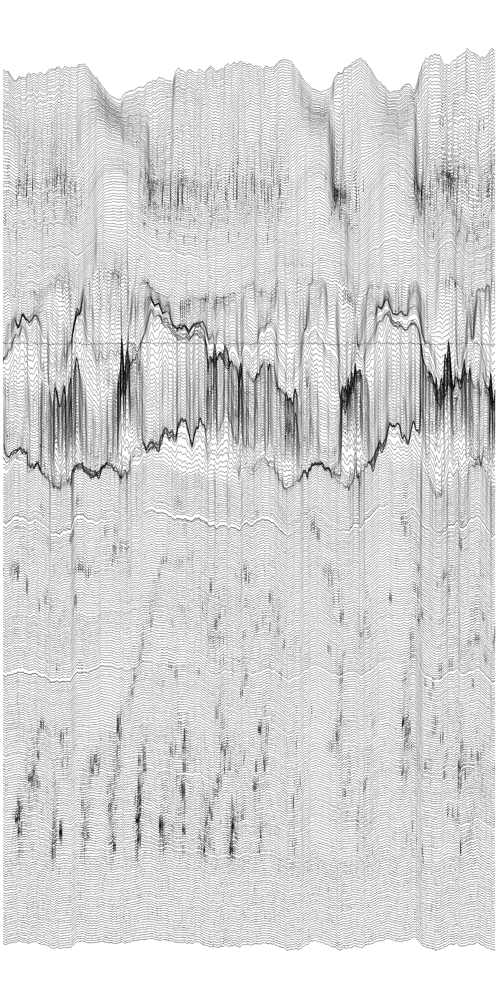

In [18]:
plot_lfp(nrem_lfp)

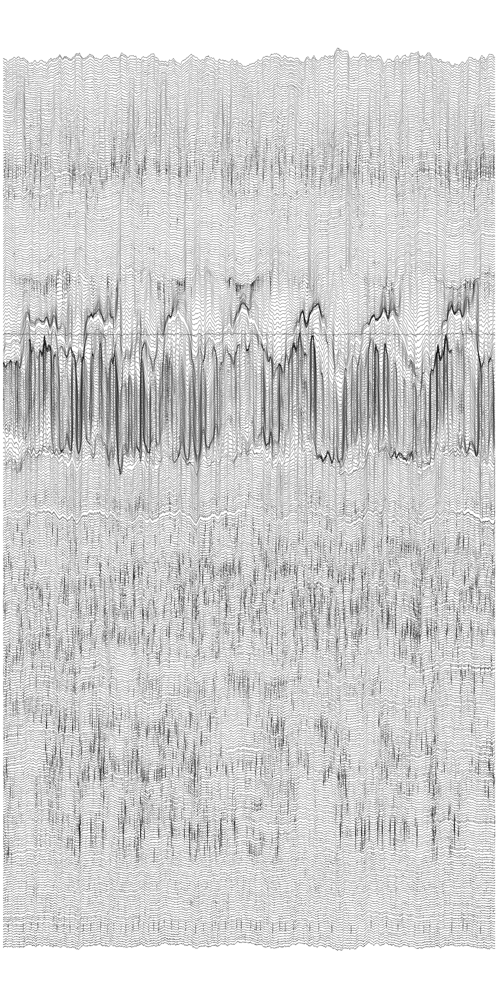

In [19]:
plot_lfp(rem_lfp)

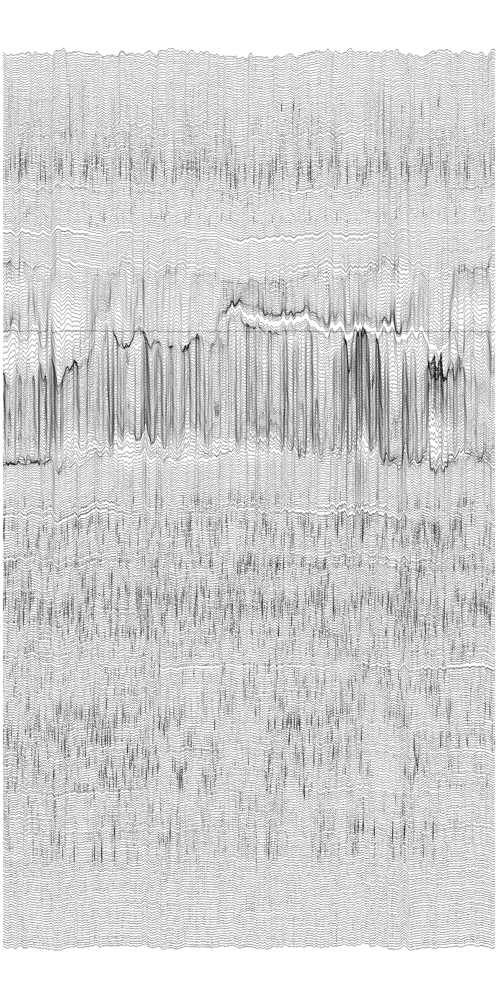

In [20]:
plot_lfp(wake_lfp)

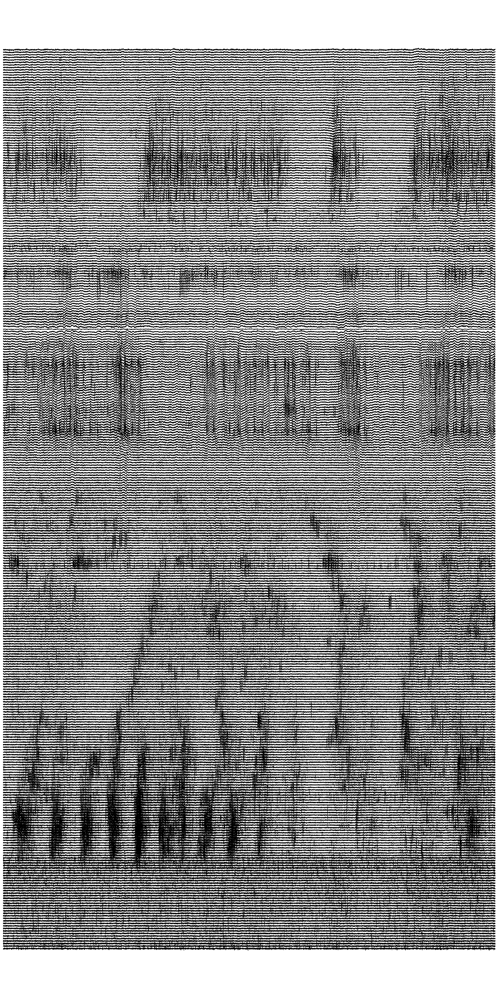

In [21]:
plot_ap(nrem_ap)

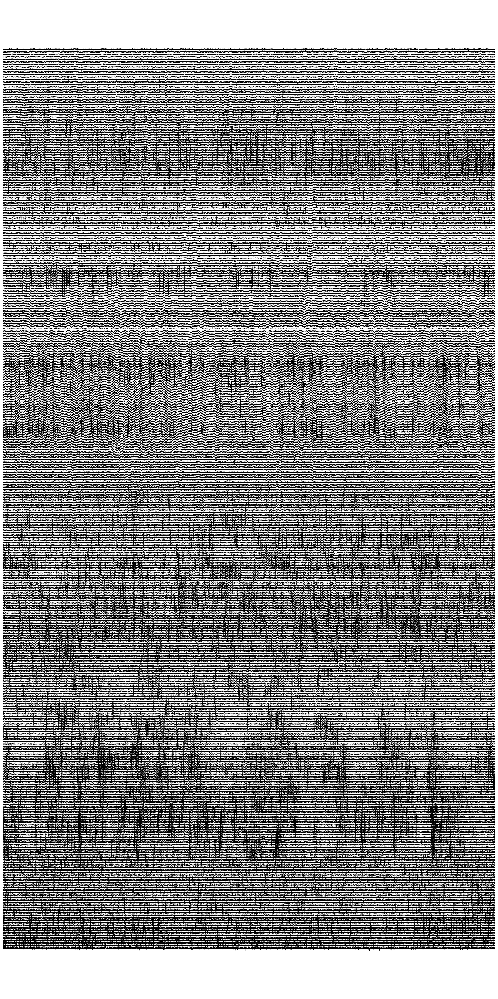

In [22]:
plot_ap(rem_ap)

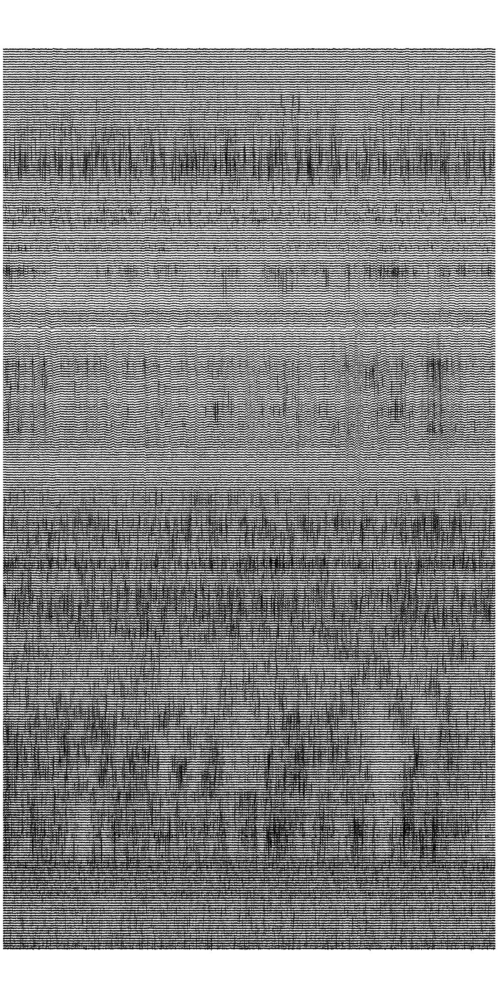

In [23]:
plot_ap(wake_ap)